# Descriptive Analysis

This file contains the descriptive analysis of the given dataset (Chicago 2018). We will analyze temporal and geographical demand patterns, as well as defining Key Performance Indicators (KPIs)

In [69]:
# General Imports for the whole file
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import timedelta
from datetime import datetime
from pandas.plotting import register_matplotlib_converters
import folium
from folium import plugins
from folium.plugins import HeatMap
import math
import random
import timeit

## 1. Data Loading
Load the given dataset into pandas

In [16]:
bike_df = pd.read_csv('data/chicago_2018.csv')
weather = pd.read_csv('data/weather_hourly_chicago.csv')

# change datatype from string to datetime
bike_df['start_time'] = pd.to_datetime(bike_df['start_time'])
bike_df['end_time'] = pd.to_datetime(bike_df['end_time'])

In [18]:
# add useful inferrable data
bike_df['date'] = bike_df['start_time'].dt.date
bike_df['hour'] = bike_df['start_time'].dt.hour
bike_df['weekday'] = bike_df['start_time'].dt.weekday
bike_df['month'] = bike_df['start_time'].dt.month
bike_df['duration'] = bike_df['end_time'] - bike_df['start_time']

### Data Integrity

Check for missing or malformed data in the dataset

In [19]:
# how many entries are there, where start_time occurs later than end_time?
bike_df[bike_df['start_time'] > bike_df['end_time']].shape[0]

7

In [20]:
# only consider entries where start_time comes before end_time
bike_df = bike_df[bike_df['start_time'] < bike_df['end_time']]

In [21]:
# there are several very short rentals where start and end are identical --> possible erroneous rentals?!
filter1 = bike_df['start_station_id'] == bike_df['end_station_id']
filter2 = bike_df['duration'] < timedelta(seconds=120)

In [22]:
# number of those rentals
bike_df[np.logical_and(filter1, filter2)].shape[0]

7790

In [23]:
# remove those rows
# bike_df = bike_df[np.logical_not(np.logical_and(filter1, filter2))]

## 2. Temporal Demand and Seasonality

In the following, we will demonstrate how fleet usage varies during a day, a week and the year

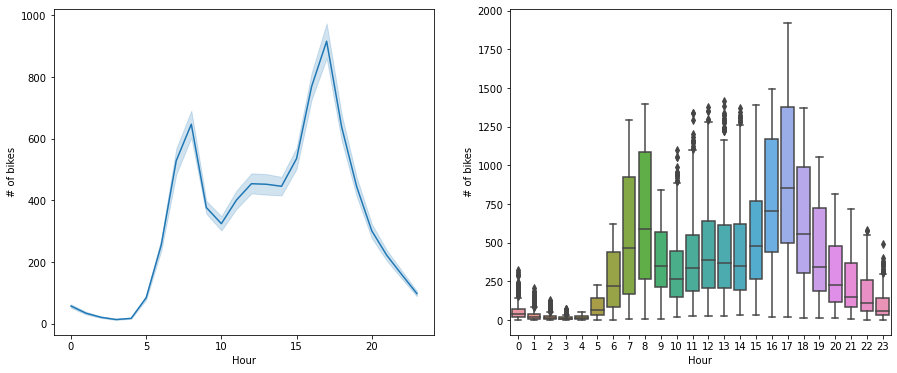

In [25]:
# hourly demand
bike_hourly_demand = bike_df.groupby(['date', 'hour'])['bike_id'].nunique()
bike_hourly_demand = pd.DataFrame(bike_hourly_demand)

fig, ax = plt.subplots(1,2, figsize=(15,6))

sns.lineplot(x=bike_hourly_demand.index.get_level_values(1), y=bike_hourly_demand['bike_id'],ax=ax[0])

sns.boxplot(x=bike_hourly_demand.index.get_level_values(1), y=bike_hourly_demand['bike_id'],ax=ax[1])

ax[0].set(xlabel='Hour', ylabel='# of bikes')
ax[1].set(xlabel='Hour', ylabel='# of bikes')
plt.show()

In [11]:
# daily demand
bike_daily_demand = bike_df.groupby(['date', 'weekday'])['bike_id'].nunique()
bike_daily_demand = pd.DataFrame(bike_daily_demand)

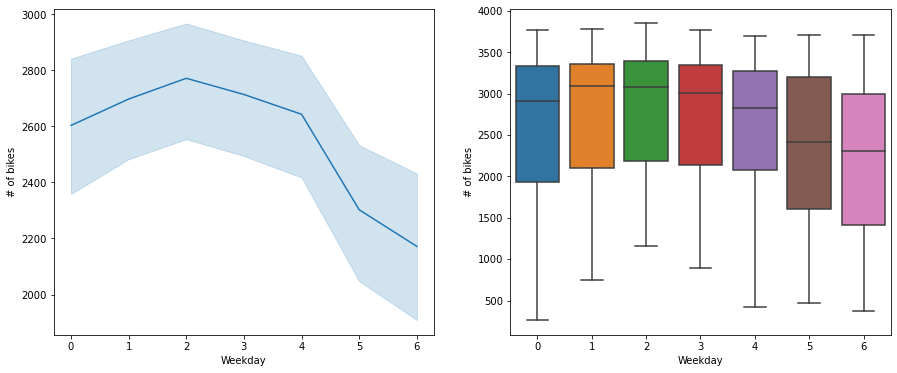

In [12]:
fig, ax = plt.subplots(1,2, figsize=(15,6))

sns.lineplot(x=bike_daily_demand.index.get_level_values(1), y=bike_daily_demand['bike_id'],ax=ax[0])

sns.boxplot(x=bike_daily_demand.index.get_level_values(1), y=bike_daily_demand['bike_id'],ax=ax[1])

ax[0].set(xlabel='Weekday', ylabel='# of bikes')
ax[1].set(xlabel='Weekday', ylabel='# of bikes')
plt.show()

In [13]:
# monthly demand
bike_monthly_demand = bike_df.groupby(['date', 'month'])['bike_id'].nunique()
bike_monthly_demand = pd.DataFrame(bike_monthly_demand)

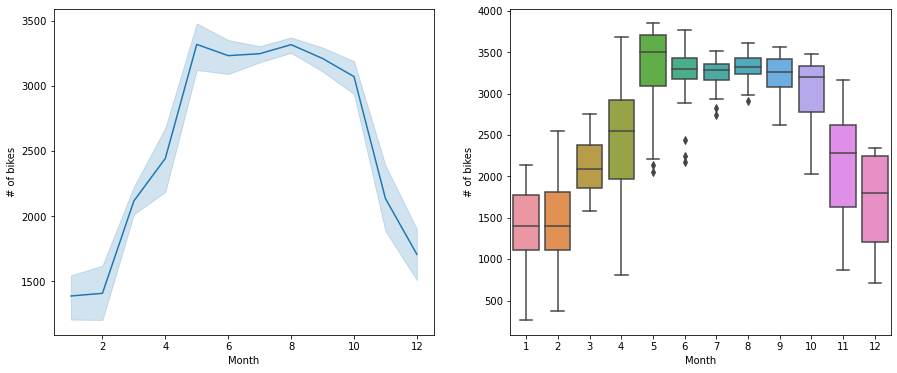

In [14]:
fig, ax = plt.subplots(1,2, figsize=(15,6))

sns.lineplot(x=bike_monthly_demand.index.get_level_values(1), y=bike_monthly_demand['bike_id'],ax=ax[0])

sns.boxplot(x=bike_monthly_demand.index.get_level_values(1), y=bike_monthly_demand['bike_id'],ax=ax[1])

ax[0].set(xlabel='Month', ylabel='# of bikes')
ax[1].set(xlabel='Month', ylabel='# of bikes')
plt.show()

In [15]:
# take aways:
# demand during the day is highest between 6-9 and 15-19
# demand during the week is higher on working days than on the weekend
# demand during the year is higher in summer than in winter

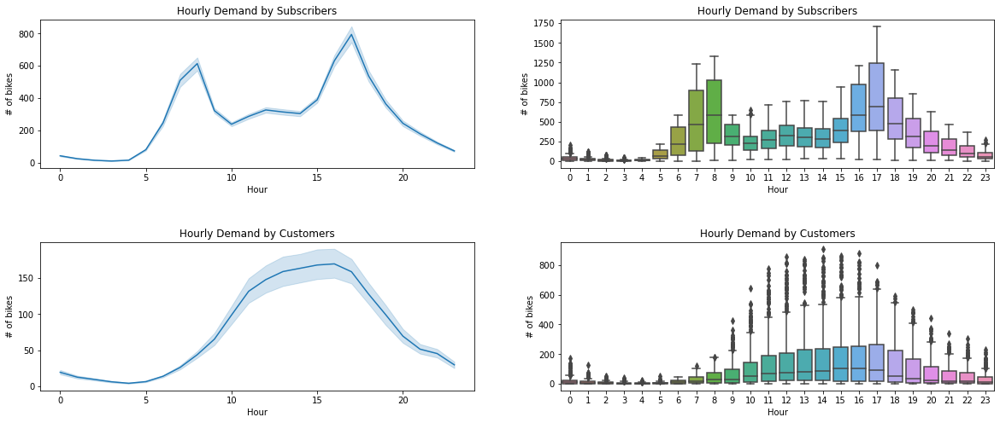

In [16]:
# hourly demand by usertype
bike_hourly_demand_subscriber = bike_df[bike_df['user_type'] == 'Subscriber'].groupby(['date', 'hour'])['bike_id'].nunique()
bike_hourly_demand_subscriber = pd.DataFrame(bike_hourly_demand_subscriber)

bike_hourly_demand_customer = bike_df[bike_df['user_type'] == 'Customer'].groupby(['date', 'hour'])['bike_id'].nunique()
bike_hourly_demand_customer = pd.DataFrame(bike_hourly_demand_customer)


fig, ax = plt.subplots(2,2, figsize=(20,8))

sns.lineplot(x=bike_hourly_demand_subscriber.index.get_level_values(1), y=bike_hourly_demand_subscriber['bike_id'],ax=ax[0,0])

sns.boxplot(x=bike_hourly_demand_subscriber.index.get_level_values(1), y=bike_hourly_demand_subscriber['bike_id'],ax=ax[0,1])

sns.lineplot(x=bike_hourly_demand_customer.index.get_level_values(1), y=bike_hourly_demand_customer['bike_id'],ax=ax[1,0])

sns.boxplot(x=bike_hourly_demand_customer.index.get_level_values(1), y=bike_hourly_demand_customer['bike_id'],ax=ax[1,1])

ax[0,0].set(xlabel='Hour', ylabel='# of bikes')
ax[0,1].set(xlabel='Hour', ylabel='# of bikes')
ax[1,0].set(xlabel='Hour', ylabel='# of bikes')
ax[1,1].set(xlabel='Hour', ylabel='# of bikes')

fig.subplots_adjust(hspace=.5)

ax[0,0].set_title('Hourly Demand by Subscribers')
ax[0,1].set_title('Hourly Demand by Subscribers')
ax[1,0].set_title('Hourly Demand by Customers')
ax[1,1].set_title('Hourly Demand by Customers')

plt.show()

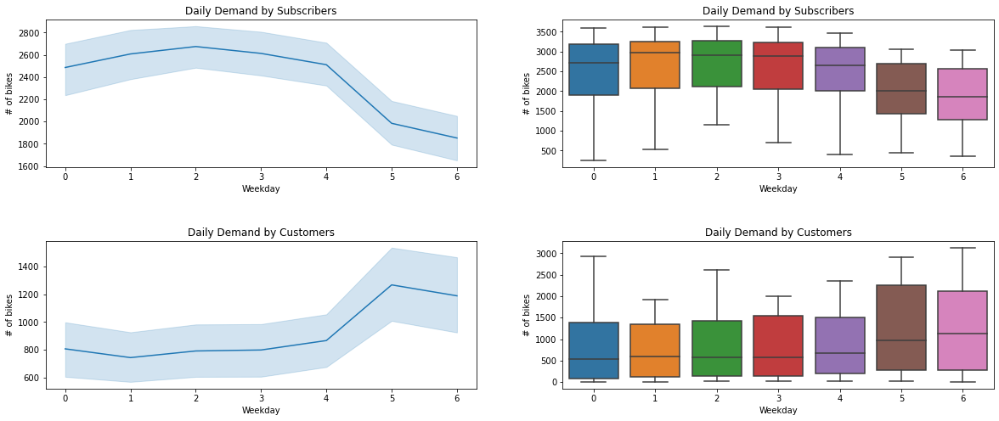

In [17]:
# daily demand by usertype
bike_daily_demand_subscriber = bike_df[bike_df['user_type'] == 'Subscriber'].groupby(['date', 'weekday'])['bike_id'].nunique()
bike_daily_demand_subscriber = pd.DataFrame(bike_daily_demand_subscriber)

bike_daily_demand_customer = bike_df[bike_df['user_type'] == 'Customer'].groupby(['date', 'weekday'])['bike_id'].nunique()
bike_daily_demand_customer = pd.DataFrame(bike_daily_demand_customer)


fig, ax = plt.subplots(2,2, figsize=(20,8))

sns.lineplot(x=bike_daily_demand_subscriber.index.get_level_values(1), y=bike_daily_demand_subscriber['bike_id'],ax=ax[0,0])

sns.boxplot(x=bike_daily_demand_subscriber.index.get_level_values(1), y=bike_daily_demand_subscriber['bike_id'],ax=ax[0,1])

sns.lineplot(x=bike_daily_demand_customer.index.get_level_values(1), y=bike_daily_demand_customer['bike_id'],ax=ax[1,0])

sns.boxplot(x=bike_daily_demand_customer.index.get_level_values(1), y=bike_daily_demand_customer['bike_id'],ax=ax[1,1])

ax[0,0].set(xlabel='Weekday', ylabel='# of bikes')
ax[0,1].set(xlabel='Weekday', ylabel='# of bikes')
ax[1,0].set(xlabel='Weekday', ylabel='# of bikes')
ax[1,1].set(xlabel='Weekday', ylabel='# of bikes')

fig.subplots_adjust(hspace=.5)

ax[0,0].set_title('Daily Demand by Subscribers')
ax[0,1].set_title('Daily Demand by Subscribers')
ax[1,0].set_title('Daily Demand by Customers')
ax[1,1].set_title('Daily Demand by Customers')

plt.show()

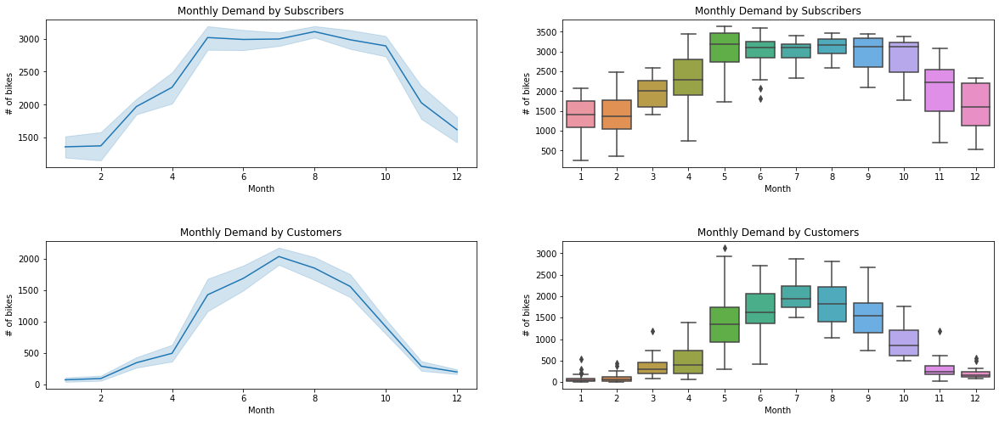

In [18]:
# monthly demand by usertype
bike_monthly_demand_subscriber = bike_df[bike_df['user_type'] == 'Subscriber'].groupby(['date', 'month'])['bike_id'].nunique()
bike_monthly_demand_subscriber = pd.DataFrame(bike_monthly_demand_subscriber)

bike_monthy_demand_customer = bike_df[bike_df['user_type'] == 'Customer'].groupby(['date', 'month'])['bike_id'].nunique()
bike_monthy_demand_customer = pd.DataFrame(bike_monthy_demand_customer)


fig, ax = plt.subplots(2,2, figsize=(20,8))

sns.lineplot(x=bike_monthly_demand_subscriber.index.get_level_values(1), y=bike_monthly_demand_subscriber['bike_id'],ax=ax[0,0])

sns.boxplot(x=bike_monthly_demand_subscriber.index.get_level_values(1), y=bike_monthly_demand_subscriber['bike_id'],ax=ax[0,1])

sns.lineplot(x=bike_monthy_demand_customer.index.get_level_values(1), y=bike_monthy_demand_customer['bike_id'],ax=ax[1,0])

sns.boxplot(x=bike_monthy_demand_customer.index.get_level_values(1), y=bike_monthy_demand_customer['bike_id'],ax=ax[1,1])

ax[0,0].set(xlabel='Month', ylabel='# of bikes')
ax[0,1].set(xlabel='Month', ylabel='# of bikes')
ax[1,0].set(xlabel='Month', ylabel='# of bikes')
ax[1,1].set(xlabel='Month', ylabel='# of bikes')

fig.subplots_adjust(hspace=.5)

ax[0,0].set_title('Monthly Demand by Subscribers')
ax[0,1].set_title('Monthly Demand by Subscribers')
ax[1,0].set_title('Monthly Demand by Customers')
ax[1,1].set_title('Monthly Demand by Customers')

plt.show()

## 3. Geographical Demand

Next up we will investigate the recognisable geographical patterns in the dataset 

Now I am interested into how many observations there are within the dataset.

In [26]:
bike_df.count()

start_time            3603075
end_time              3603075
start_station_id      3603075
end_station_id        3603075
start_station_name    3603075
end_station_name      3603075
bike_id               3603075
user_type             3603075
date                  3603075
hour                  3603075
weekday               3603075
month                 3603075
duration              3603075
dtype: int64

How many *start* and *end* stations are there?

In [28]:
start_stations = list(bike_df["start_station_id"].unique())
end_stations = list(bike_df["end_station_id"].unique())
print("There are", len(start_stations), "start stations, and", len(end_stations), "end stations")

There are 621 start stations, and 619 end stations


Thus there are 2 more start stations than end stations. This might be because there are stations,
* in which you can only rent a bike; not return
* which have multiple IDs
* which are only for maintenance purposes

Or because
* start station IDs and end station IDs are completely uncoupled and one of the reasons above

I was wondering how big the fleet is:

In [29]:
def getTime(str):
    return datetime.strptime(str, '%Y-%m-%d %H:%M:%S')

In [30]:
num_bikes = len(list(bike_df["bike_id"].unique()))

print("The fleet consists of", num_bikes, "bikes.")

The fleet consists of 6133 bikes.


What is the ratio of subscribed users as compared to all users in 2018?

In [31]:
num_subs = len(bike_df[bike_df["user_type"] == "Subscriber"])
num_tot = len(bike_df)

print(round((num_subs / num_tot * 100), 2), "% of users are actual subscribers")

81.21 % of users are actual subscribers


Check for null values.

In [32]:
bike_df[bike_df["user_type"].isnull()]

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,date,hour,weekday,month,duration


Seemingly no null values in the dataset.

In [41]:
bike_df.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,date,hour,weekday,month,duration
0,2018-04-01 00:04:44,2018-04-01 00:13:03,22,171,May St & Taylor St,May St & Cullerton St,3819,Subscriber,2018-04-01,0,6,4,0 days 00:08:19
1,2018-04-01 00:06:42,2018-04-01 00:27:07,157,190,Lake Shore Dr & Wellington Ave,Southport Ave & Wrightwood Ave,5000,Subscriber,2018-04-01,0,6,4,0 days 00:20:25
2,2018-04-01 00:07:19,2018-04-01 00:23:19,106,106,State St & Pearson St,State St & Pearson St,5165,Customer,2018-04-01,0,6,4,0 days 00:16:00
3,2018-04-01 00:07:33,2018-04-01 00:14:47,241,171,Morgan St & Polk St,May St & Cullerton St,3851,Subscriber,2018-04-01,0,6,4,0 days 00:07:14
4,2018-04-01 00:10:23,2018-04-01 00:22:12,228,219,Damen Ave & Melrose Ave,Damen Ave & Cortland St,5065,Subscriber,2018-04-01,0,6,4,0 days 00:11:49


In [42]:
bike_df["duration"].sort_values().head(10)

1702553   0 days 00:01:01
732084    0 days 00:01:01
3156441   0 days 00:01:01
3115142   0 days 00:01:01
972946    0 days 00:01:01
132321    0 days 00:01:01
212180    0 days 00:01:01
420911    0 days 00:01:01
1557562   0 days 00:01:01
2952922   0 days 00:01:01
Name: duration, dtype: timedelta64[ns]

7 subsequent observations have a negative duration. Looking at the dates, it becomes obvious, that the underlying reason is the time change:

You can find information about the **negative** time change (summer to winter time on the 4th of November 2018: 2 PM to 1 PM) [here](https://www.timeanddate.de/stadt/zeitumstellung/usa/chicago).

It may be necessary to adjust values for the other **positive** time change (winter to summer on the 11th of May 2018: 2 PM to 3 PM).

How high is the maximum and minimum utilization of the fleet?

First I need to define a function which converts the string into a datetime format.

Depending on your machine, the following operations might take a while. Eventually it will terminate...

In [50]:
time_bike = np.empty(6500)

for index, row in bike_df.iterrows():
    time_bike[row["bike_id"]] = time_bike[row["bike_id"]] + (((row["end_time"]) - (row["start_time"])).total_seconds() / 3600)

In [51]:
time_bike_series = pd.DataFrame(time_bike, columns = ["Utilization"])

In [52]:
time_bike_series.describe()

,Utilization
count,6500.000000
mean,217.592714
std,243.911680
min,0.000000
25%,121.306597
50%,190.135694
75%,252.717639
max,4020.131111


In [53]:
time_bike_series.dropna(inplace = True)

In [54]:
time_bike_series.tail()

,Utilization
6495,0.0
6496,0.0
6497,0.0
6498,0.0
6499,0.0


In [55]:
time_bike_series.describe()

,Utilization
count,6500.000000
mean,217.592714
std,243.911680
min,0.000000
25%,121.306597
50%,190.135694
75%,252.717639
max,4020.131111


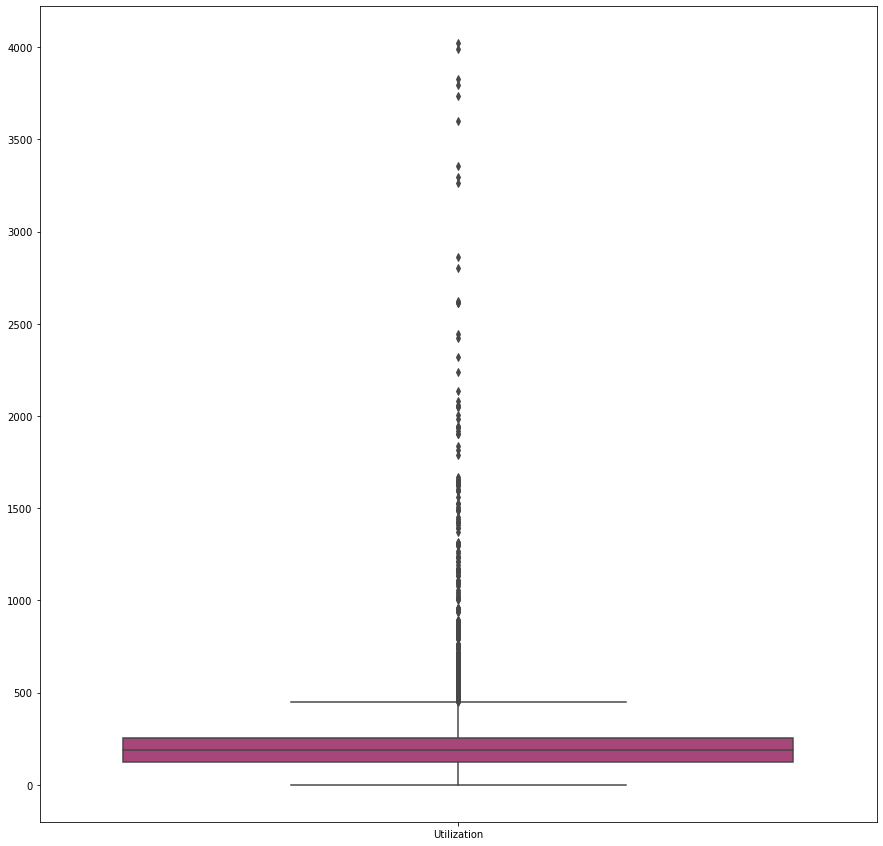

In [56]:
f, axes = plt.subplots(1, sharey=True, figsize=(15, 15))

sns.boxplot(data = time_bike_series, palette = "magma")
plt.show()

Which bike was used the most?

In [57]:
time_bike_series[time_bike_series["Utilization"] >= 4000]

,Utilization
471,4020.131111


Average utilization: (The average utilization will be way higher as there are also alot of null values included in this aggregation)

In [58]:
av_ut = float((time_bike_series.mean() / (24 * 365))*100)

print("The average utilization is:", av_ut, "%")

The average utilization is: 2.483935092007181 %


Which stations are used the most?

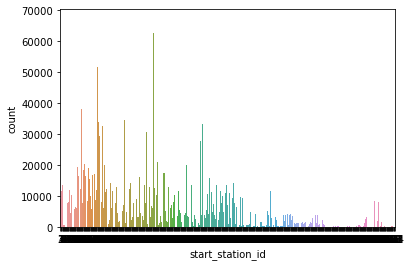

In [59]:
sns.countplot(x = "start_station_id", data = bike_df)
plt.show()

Which station is used the most?

In [60]:
station_mostused = bike_df["start_station_id"].value_counts().idxmax()
print("The most used start station is the station with id", station_mostused)

The most used start station is the station with id 35


# An attempt to visualize the most used stations geographically

First I import a dataset that I found on the [internet](https://data.cityofchicago.org/Transportation/Divvy-Bicycle-Stations-In-Service/67g3-8ig8) to describe the position (long, lat) of the stations.

In [62]:
data_stations = pd.read_csv("data/Divvy_Bicycle_Stations_-_In_Service.csv")

In [63]:
data_stations.head(10)

,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location
0,373,Kedzie Ave & Chicago Ave,11,11,In Service,41.895465,-87.706128,"(41.89546530305, -87.7061278837)"
1,641,Central Park Ave & Bloomingdale Ave,11,11,In Service,41.914166,-87.716755,"(41.914166, -87.716755)"
2,102,Stony Island Ave & 67th St,11,11,In Service,41.773458,-87.585340,"(41.77345849948, -87.5853397391)"
3,438,Central Park Ave & Ogden Ave,15,15,In Service,41.854064,-87.715117,"(41.854063503874464, -87.71511733531952)"
4,656,Damen Ave & Walnut (Lake) St,15,15,In Service,41.885951,-87.677009,"(41.885951, -87.677009)"
5,691,Eggleston Ave & 92nd St,15,15,In Service,41.727576,-87.634828,"(41.727575659299575, -87.63482809066771)"
6,648,Carpenter St & 63rd St,7,7,In Service,41.779870,-87.650919,"(41.77987, -87.650919)"
7,418,Ellis Ave & 53rd St,11,11,In Service,41.799336,-87.600958,"(41.79933626261, -87.6009581145)"
8,649,Stewart Ave & 63rd St,11,11,In Service,41.779835,-87.634774,"(41.779835, -87.634774)"
9,658,Leavitt St & Division St,15,15,In Service,41.902997,-87.683825,"(41.902997, -87.683825)"


Joining (merging) the initial dataset with the dataset, which contains the coordinates for the stations on the column 'start_station_id', respectively 'ID'

In [64]:
merged_data = pd.merge(bike_df, data_stations, left_on = "start_station_id", right_on = "ID")

In [65]:
merged_data.head(3)

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,date,hour,...,month,duration,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location
0,2018-04-01 00:04:44,2018-04-01 00:13:03,22,171,May St & Taylor St,May St & Cullerton St,3819,Subscriber,2018-04-01,0,...,4,0 days 00:08:19,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)"
1,2018-04-01 11:21:46,2018-04-01 11:30:46,22,103,May St & Taylor St,Clinton St & Polk St (*),595,Subscriber,2018-04-01,11,...,4,0 days 00:09:00,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)"
2,2018-04-01 11:40:54,2018-04-01 11:47:45,22,342,May St & Taylor St,Wolcott Ave & Polk St,6457,Subscriber,2018-04-01,11,...,4,0 days 00:06:51,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)"


Adding a new column "Coordinates" because the location, lat' and long' variables cannot be simply plotted by folium.

In [70]:
merged_data["Coordinates"] = list(zip(merged_data["Latitude"].round(4), merged_data["Longitude"].round(4)))

In [71]:
merged_data.head(3)

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,date,hour,...,duration,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location,Coordinates
0,2018-04-01 00:04:44,2018-04-01 00:13:03,22,171,May St & Taylor St,May St & Cullerton St,3819,Subscriber,2018-04-01,0,...,0 days 00:08:19,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)"
1,2018-04-01 11:21:46,2018-04-01 11:30:46,22,103,May St & Taylor St,Clinton St & Polk St (*),595,Subscriber,2018-04-01,11,...,0 days 00:09:00,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)"
2,2018-04-01 11:40:54,2018-04-01 11:47:45,22,342,May St & Taylor St,Wolcott Ave & Polk St,6457,Subscriber,2018-04-01,11,...,0 days 00:06:51,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)"


In [72]:
sns.set()
sns.set_style("white")
sns.set_palette("GnBu_d")

# First visualization attempts

I will select a random bike for showing the locations to avoid overplotting and to avoid performance issues

In [73]:
list_bikes = bike_df["bike_id"].unique()
random_bike = random.choice(list_bikes)
print(random_bike)

3818


In [74]:
heat_map = folium.Map(location=(41.8695, -87.6555), tiles='OpenStreetMap', zoom_start=9, control_scale=True, max_zoom=20)

heat_map.add_child(plugins.HeatMap(merged_data[merged_data["bike_id"] == random_bike]["Coordinates"], radius = 15))

heat_map

Sclicing the dataframe in order to be able to assign the correct popup to the markers

In [75]:
station_location = merged_data[['start_station_id', 'Latitude', 'Longitude']].copy()
station_location = station_location.drop_duplicates(subset = ["start_station_id"])
station_location.head(10)

,start_station_id,Latitude,Longitude
0,22,41.869482,-87.655486
9437,157,41.936688,-87.636829
20677,106,41.897448,-87.628722
32618,241,41.871737,-87.651030
47115,228,41.940600,-87.678500
49933,244,41.954690,-87.673930
54430,128,41.895769,-87.677220
64277,130,41.903266,-87.678435
71049,121,41.802562,-87.590368
74245,31,41.896747,-87.635668


In [76]:
heat_map = folium.Map(location=(41.8695, -87.6555), tiles='OpenStreetMap', zoom_start=9, control_scale=True, max_zoom=20)

heat_map.add_child(plugins.HeatMap(merged_data[merged_data["bike_id"] == random_bike]["Coordinates"], radius = 15))

for indice, row in station_location.iterrows():
    folium.CircleMarker(
        radius = 1,
        location=[row["Latitude"], row["Longitude"]],
        popup=row['start_station_id'],
        color='crimson', 
        fill_color='crimson'
    ).add_to(heat_map)
  
heat_map

Plotting the density of used bikestations for bikes with an id lower than 1000 (because plotting this for all bikes would just not terminate)

In [77]:
heat_map = folium.Map(location=(41.8695, -87.6555), tiles='OpenStreetMap', zoom_start=9, control_scale=True, max_zoom=20)

heat_map.add_child(plugins.HeatMap(merged_data[merged_data["bike_id"] < 1000]["Coordinates"], radius = 15))

heat_map

Adding a column 'end_hour' to the dataframe, in order to be able to easily access only the hour from the 'end_time' timestamp

In [78]:
merged_data['end_time'] = pd.to_datetime(merged_data['end_time'])
merged_data["end_hour"] = list(merged_data["end_time"].dt.hour)
merged_data.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,date,hour,...,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location,Coordinates,end_hour
0,2018-04-01 00:04:44,2018-04-01 00:13:03,22,171,May St & Taylor St,May St & Cullerton St,3819,Subscriber,2018-04-01,0,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",0
1,2018-04-01 11:21:46,2018-04-01 11:30:46,22,103,May St & Taylor St,Clinton St & Polk St (*),595,Subscriber,2018-04-01,11,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",11
2,2018-04-01 11:40:54,2018-04-01 11:47:45,22,342,May St & Taylor St,Wolcott Ave & Polk St,6457,Subscriber,2018-04-01,11,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",11
3,2018-04-01 15:22:44,2018-04-01 15:40:08,22,47,May St & Taylor St,State St & Kinzie St,5797,Subscriber,2018-04-01,15,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",15
4,2018-04-01 15:22:44,2018-04-01 15:40:08,22,47,May St & Taylor St,State St & Kinzie St,2295,Subscriber,2018-04-01,15,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",15


Now taking all rows with an end time between 6am and 10am and assigning it to a new dataframe 

In [79]:
morning_stations = merged_data[(merged_data["end_hour"]<=9) & (merged_data["end_hour"] >= 6)]
morning_stations.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,date,hour,...,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location,Coordinates,end_hour
8,2018-04-02 08:10:35,2018-04-02 08:15:39,22,317,May St & Taylor St,Wood St & Taylor St,4179,Subscriber,2018-04-02,8,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",8
26,2018-04-03 08:01:24,2018-04-03 08:08:29,22,317,May St & Taylor St,Wood St & Taylor St,2632,Subscriber,2018-04-03,8,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",8
27,2018-04-03 09:28:51,2018-04-03 09:37:44,22,414,May St & Taylor St,Canal St & Taylor St,3375,Subscriber,2018-04-03,9,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",9
36,2018-04-04 07:58:13,2018-04-04 08:22:05,22,111,May St & Taylor St,Sedgwick St & Huron St,864,Subscriber,2018-04-04,7,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",8
37,2018-04-04 08:05:52,2018-04-04 08:13:58,22,317,May St & Taylor St,Wood St & Taylor St,4132,Subscriber,2018-04-04,8,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",8


Now taking all rows with an end time between 4pm and 7pm and assigning it to a new dataframe 

In [80]:
evening_stations = merged_data[(merged_data["end_hour"]<=18) & (merged_data["end_hour"] >= 16)]
evening_stations.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,date,hour,...,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location,Coordinates,end_hour
6,2018-04-01 18:23:51,2018-04-01 18:26:44,22,241,May St & Taylor St,Morgan St & Polk St,4913,Subscriber,2018-04-01,18,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",18
15,2018-04-02 16:45:36,2018-04-02 17:03:34,22,287,May St & Taylor St,Franklin St & Monroe St,3851,Subscriber,2018-04-02,16,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",17
16,2018-04-02 16:45:36,2018-04-02 17:03:38,22,287,May St & Taylor St,Franklin St & Monroe St,1642,Subscriber,2018-04-02,16,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",17
17,2018-04-02 16:52:24,2018-04-02 16:56:50,22,137,May St & Taylor St,Morgan Ave & 14th Pl,4438,Subscriber,2018-04-02,16,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",16
33,2018-04-03 16:15:42,2018-04-03 16:31:12,22,33,May St & Taylor St,State St & Van Buren St,2708,Subscriber,2018-04-03,16,...,22,May St & Taylor St,15,15,In Service,41.869482,-87.655486,"(41.8694821, -87.6554864)","(41.8695, -87.6555)",16


Now we are able to **map all the stations, where people frequently drive to in the morning hours**. These stations will probably be in close proximity to common workplaces

In [81]:
heat_map = folium.Map(location=(41.8695, -87.6555), tiles='OpenStreetMap', zoom_start=9, control_scale=True, max_zoom=20)

heat_map.add_child(plugins.HeatMap(morning_stations[morning_stations["bike_id"]==random_bike]["Coordinates"], radius = 15))

for indice, row in station_location.iterrows():
    folium.CircleMarker(
        radius = 1,
        location=[row["Latitude"], row["Longitude"]],
        popup=row['start_station_id'],
        color='crimson', 
        fill_color='crimson'
    ).add_to(heat_map)

heat_map

It seems that there is a clear aggregation of trips to the **central station** in the **morning hours**

Now we do the same for the **evening hours** , i.e. the end stations people drive to after work

In [82]:
heat_map = folium.Map(location=(41.8695, -87.6555), tiles='OpenStreetMap', zoom_start=9, control_scale=True, max_zoom=20)

heat_map.add_child(plugins.HeatMap(evening_stations[evening_stations["bike_id"]==random_bike]["Coordinates"], radius = 15))

for indice, row in station_location.iterrows():
    folium.CircleMarker(
        radius = 1,
        location=[row["Latitude"], row["Longitude"]],
        popup=row['start_station_id'],
        color='crimson', 
        fill_color='crimson'
    ).add_to(heat_map)

heat_map

Now it is harder to identify a clear direction to where trips are typically going

We now try to identify the movement of the selected bike. We therefore draw the stations and trajectories.

In [83]:
heat_map = folium.Map(location=(41.8695, -87.6555), tiles='OpenStreetMap', zoom_start=9, control_scale=True, max_zoom=20)

merged_data_select = merged_data[merged_data["bike_id"]==random_bike]

heat_map.add_child(plugins.HeatMap(merged_data[merged_data["bike_id"] == random_bike]["Coordinates"], radius = 15))

for indice, row in station_location.iterrows():
    folium.CircleMarker(
        radius = 1,
        location=[row["Latitude"], row["Longitude"]],
        popup=row['start_station_id'],
        color='crimson', 
        fill_color='crimson'
    ).add_to(heat_map)

folium.PolyLine(merged_data_select["Coordinates"],color="blue", weight=2, opacity=0.8, ).add_to(heat_map)
    
heat_map

# Geographical Findings

## Communities with most Divvy Bikes traffic

![test](Chicago_community_areas_map.svg.png)

* all of Center

## Locations / POI with most traffic

In some zoom-scales (and the given radius) one can identify the following highly used stations:

* [Ogilvie Transportation Center](https://en.wikipedia.org/wiki/Ogilvie_Transportation_Center)
* [Chicago Union Station](https://en.wikipedia.org/wiki/Chicago_Union_Station)
* Jane Addams Memorial, see [googlemaps](https://www.google.de/maps/place/Divvy/@41.8922479,-87.6121172,88m/data=!3m1!1e3!4m13!1m7!3m6!1s0x880e2c3cd0f4cbed:0xafe0a6ad09c0c000!2sChicago,+IL,+USA!3b1!8m2!3d41.8781136!4d-87.6297982!3m4!1s0x880e2b53a71cd513:0xd04bc26796dcb054!8m2!3d41.892278!4d-87.612043) for position


# Attempt to take POI into consideration

The list of POI was found on [Wikipedia](https://en.wikipedia.org/wiki/List_of_Chicago_Landmarks) and can be downloaded under this [Link](https://tools.wmflabs.org/kmlexport?article=List_of_Chicago_Landmarks).

I had to reformat the file manually because of some issues that caused the file to not be read in properly by pandas.

In [84]:
POI_data = pd.read_csv("convertcsvtest.csv")

FileNotFoundError: [Errno 2] No such file or directory: 'convertcsvtest.csv'

In [ ]:
POI_data.head()

In [ ]:
POI_data.info()

In [ ]:
POI_data.head()

In [ ]:
POI_data["Coordinates"] = list(zip(POI_data["long"].round(4), POI_data["lat"].round(4)))

In [ ]:
POI_data.count()

In [85]:
POI_data.head()

NameError: name 'POI_data' is not defined

In [86]:
heat_map = folium.Map(location=(41.8695, -87.6555), tiles='OpenStreetMap', zoom_start=9, control_scale=True, max_zoom=20)

heat_map.add_child(plugins.HeatMap(merged_data[merged_data["bike_id"] < 1000]["Coordinates"], radius = 15))

positions = list(POI_data["Coordinates"])
for position in positions:
    folium.CircleMarker(radius=1, location=position, popup='The Waterfront', 
                                 color='crimson', fill_color='crimson').add_to(heat_map)

heat_map

NameError: name 'POI_data' is not defined

It seems that those POI's correspond nicely to the density of used stations.

## Finding out which stations are most popular

In [ ]:
data_stations.head()

In [ ]:
data_stations.info()

In [ ]:
data_stations.loc[2, "ID"]

In [87]:
for i in range(693):
    data_stations.loc[i, "Usage"] = len(merged_data[merged_data["start_station_id"] == data_stations.loc[i, "ID"]])

KeyError: 690

In [ ]:
data_stations["Coordinates"] = list(zip(data_stations["Latitude"].round(4), data_stations["Longitude"].round(4)))

In [ ]:
data_stations.head()

In [ ]:
data_stations["Usage"].describe()

In [ ]:
sns.displot(data = data_stations["Usage"] , kde=True)

plt.show()

As expected a poisson-like distribution with a wide base of rather unpopular stations and a tiny share of extremely popular stations.

In [ ]:
len(bike_df["start_station_id"].unique())

In the following I attempt to plot the tops (reddish) and flops (blue) of stations in terms of popularity on a map.

In [ ]:
topTwy = data_stations[data_stations["ID"] <= 621].sort_values("Usage").tail(100)
lowTwy = data_stations[data_stations["ID"] <= 621].sort_values("Usage").head(100)

In [ ]:
topTwy["Popular"] = "crimson"
lowTwy["Popular"] = "blue"

topLowTwy = [topTwy, lowTwy]
topLowTwy = pd.concat(topLowTwy)
topLowTwy

In [ ]:
heat_map = folium.Map(location=(41.8695, -87.6555), tiles='OpenStreetMap', zoom_start=9, control_scale=True, max_zoom=20)

for i in range(len(topLowTwy)):
    folium.CircleMarker(radius=1, location = topLowTwy.iloc[i]["Coordinates"], 
                                 color=topLowTwy.iloc[i]["Popular"], popup = topLowTwy.iloc[i]["ID"], fill_color='crimson').add_to(heat_map)

heat_map

As popular and unpopular stations nicely discriminate geographically, I'm interested as to how the entirety of stations would be ordered. 

In [ ]:
data_stations = data_stations[data_stations["ID"] < 621].sort_values("Usage")

g1 = data_stations[data_stations["Usage"] < 1000]
g2 = data_stations[(data_stations["Usage"] >= 1000) & (data_stations["Usage"] < 10000)]
g3 = data_stations[data_stations["Usage"] >= 10000]
                   
g1["Color"] = "green"
g2["Color"] = "yellow"
g3["Color"] = "red"

stat = [g1, g2, g3]
stat = pd.concat(stat)
stat

In [ ]:
heat_map = folium.Map(location=(41.8695, -87.6555), tiles='OpenStreetMap', zoom_start=9, control_scale=True, max_zoom=20)

for i in range(len(stat)):
    folium.CircleMarker(radius=2, location = stat.iloc[i]["Coordinates"], 
                                 color=stat.iloc[i]["Color"], fill_color='crimson',
                                   popup = stat.iloc[i]["Usage"]).add_to(heat_map)

heat_map

### Sights:

* University of Chicago (in an area of unpopular stations, you can easily find the station as it is a red marker in a bunch of yellow markers in the south)

In [ ]:
bike_df[bike_df["start_station_id"] == 542].sort_values("start_time")

In [ ]:
stat[stat["ID"] == 542]["Usage"]

### Finding out when new stations were established

In [ ]:
bike_df[bike_df["start_station_id"] == 345]["start_time"].min()

In [ ]:
def getFirstDate(ID):
    return getTime(bike_df[bike_df["start_station_id"] == ID]["start_time"].min())

In [ ]:
getFirstDate(562)

In [ ]:
data_stations["First Use"] = data_stations["ID"].apply(lambda x: getFirstDate(x))

In [ ]:
data_stations.head()

In [ ]:
cutDate1 = pd.to_datetime("1st of February, 2018")
cutDate2 = pd.to_datetime("1st of May, 2018")

In [ ]:
data_stations.iloc[34]["First Use"] < cutDate1

In [ ]:
def categorize(x, a, b):
    if data_stations.iloc[x]["First Use"] < a:
        return "green"
    elif ((data_stations.iloc[x]["First Use"] >= a) & (data_stations.iloc[x]["First Use"] < b)):
        return "yellow"
    elif data_stations.iloc[x]["First Use"] > b:
        return "red"

In [ ]:
cutDate1 > cutDate2

In [ ]:
heat_map = folium.Map(location=(41.8695, -87.6555), tiles='OpenStreetMap', zoom_start=9, control_scale=True, max_zoom=20)

for i in range(len(data_stations)):
    folium.CircleMarker(radius=2, location = data_stations.iloc[i]["Coordinates"], 
                                 color=categorize(i, cutDate1, cutDate2), fill_color='crimson',
                                   popup = data_stations.iloc[i]["Usage"]).add_to(heat_map)

heat_map

As there is a substancial amount of unpopular stations (i.e. being used less than 100 times in a year, some even less than 30), I was wondering what reason there might be. The establishment of new stations seems like a plausible idea.

Thus I plotted all stations in a color that encodes the time of year in which the station was used first (in this period of a year).

* green: station was used in January for the first time
* yellow: station was used in February for the first time
* red: station was used only after the begin of March

With the red stations being low in number this hypothisis is to be rejected. Also it is possible that even those are old stations which just haven't been used in the cold season.

## Considering auto traffic

Again some data I found on the [internet](https://www.chicago.gov/city/en/depts/cdot/dataset/average_daily_trafficcounts.html)

### Average Daily Traffic

Average Daily Traffic refers to the number of vehicles traveling through a particular point on the city streets in a 24-hour period. Average Daily Traffic (ADT) counts are analogous to a census count of vehicles on city streets. These counts provide a close approximation to the actual number of vehicles passing through a given location on an average weekday.

In [ ]:
traffic = pd.read_csv("Average_Daily_Traffic_Counts.csv", sep = ",")

In [ ]:
traffic["Coordinates"] = list(zip(traffic["Latitude"].round(4), traffic["Longitude"].round(4)))

In [ ]:
traffic.head()

In [ ]:
heat_map = folium.Map(location=(41.8695, -87.6555), tiles='OpenStreetMap', zoom_start=10, control_scale=True, max_zoom=20)

# heat_map.add_child(plugins.HeatMap(merged_data[merged_data["bike_id"] < 1000]["Coordinates"], radius = 25))

for i in range(0,len(traffic)):
   folium.Circle(
      location=[traffic.iloc[i]['Latitude'], traffic.iloc[i]['Longitude']],
      #popup=traffic.iloc[i]['Traffic Volume Count Location Address'],
      radius=float(traffic.iloc[i]['Total Passing Vehicle Volume'])*0.005,
      color='crimson',
      fill=True,
      fill_color='crimson'
   ).add_to(heat_map)

heat_map